# Lookup Food Based on Barcode from Image

In [30]:
samples = [
    "../samples/upc/20240918_075942.jpg",
    "../samples/upc/20240918_075752.jpg",
    "../samples/upc/20240918_075933.jpg",
]

confidence_threshold = 0.5

In [2]:
%pip install -q ultralytics opencv-python matplotlib Pillow segmentation-models-pytorch pyzbar
%conda install zbar -y

Note: you may need to restart the kernel to use updated packages.
Channels:
 - defaults
 - conda-forge
Platform: linux-64
Solving environment: done

# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


In [37]:
from ultralytics import YOLO
import cv2
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import time

model = YOLO("../models/barcodes.pt")

def find_barcodes(model, image_path):
    # image_path = "../samples/counter_groceries_1.jpg"
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Perform YOLOv8 detection
    results = model(image_rgb, conf=confidence_threshold)
    cropped_images = []

    for result in results:
        # Get bounding boxes, labels, and confidences
        boxes = result.boxes.xyxy  # xyxy format bounding boxes
        confidences = result.boxes.conf
        class_ids = result.boxes.cls
        
        # Plot image
        fig, ax = plt.subplots(1, 1, figsize=(12, 8))
        ax.imshow(image_rgb)
        plt.title(f"Model: {model.model_name}")
        plt.axis('off')
        
        # Loop over each detection
        for i, box in enumerate(boxes):
            x1, y1, x2, y2 = map(int, box)  # Convert to integer
            confidence = confidences[i]
            class_id = int(class_ids[i])
            class_name = model.names[int(class_ids[i])]

            # Crop the detected barcode area
            cropped_image = image_rgb[y1:y2, x1:x2]
            cropped_image = cv2.cvtColor(cropped_image, cv2.COLOR_RGB2BGR)
            cropped_image = Image.fromarray(cropped_image)
            cropped_images.append(cropped_image)
            
            # Draw bounding box
            ax.add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, edgecolor='red', facecolor='none', linewidth=2))
            
            # Add label with confidence
            ax.text(x1, y1 - 10, f"{class_name} {confidence:.2f}", color='red', fontsize=12, backgroundcolor='white')
            
        
        plt.show()

    # Show cropped images
    if len(cropped_images):
        fig, axes = plt.subplots(1, 1, figsize=(15, 5))
        for i, ci in enumerate(cropped_images):
            plt.title(f"Barcode: {i} {type(ci)}")
            plt.axis('off')
            axes.imshow(ci)
            plt.show()

    return cropped_images


0: 640x480 1 Barcode, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


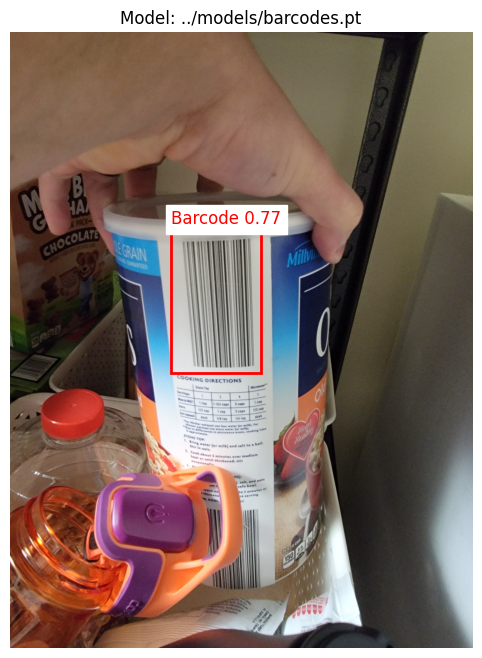

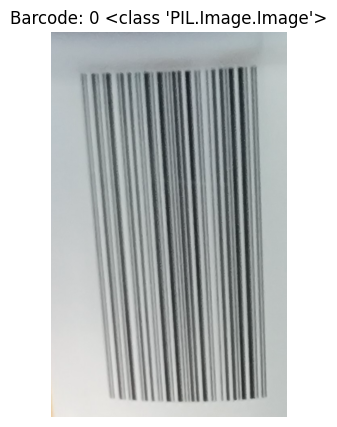

[]

In [38]:
from pyzbar.pyzbar import decode
barcode_images = find_barcodes(model, samples[0])
decode(barcode_images[0])

In [45]:
img = Image.open(samples[0])
codes = decode(img)
codes[0].data.decode('utf-8')


'4099100207149'

In [47]:
import os

# Get the directory of the first sample
directory = os.path.dirname(samples[0])

# Loop over all files in the directory
for filename in os.listdir(directory):
    file_path = os.path.join(directory, filename)
    if os.path.isfile(file_path):
        img = Image.open(file_path)
        codes = decode(img)
        for code in codes:
            print(code.data.decode('utf-8'))

0078510000001
4099100041187
4099100086591
4099100146066
4099100150742
4099100006162
4099100086591
4099100207149
4099100146066


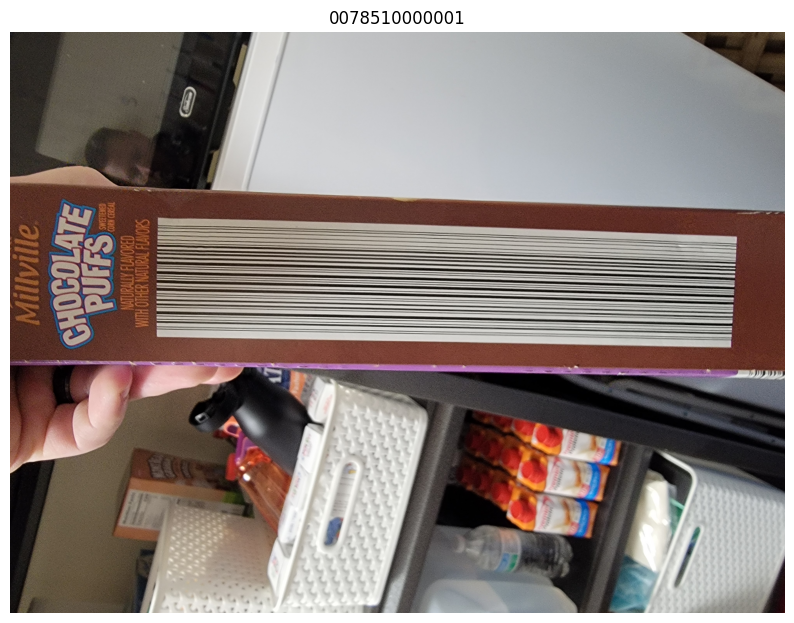

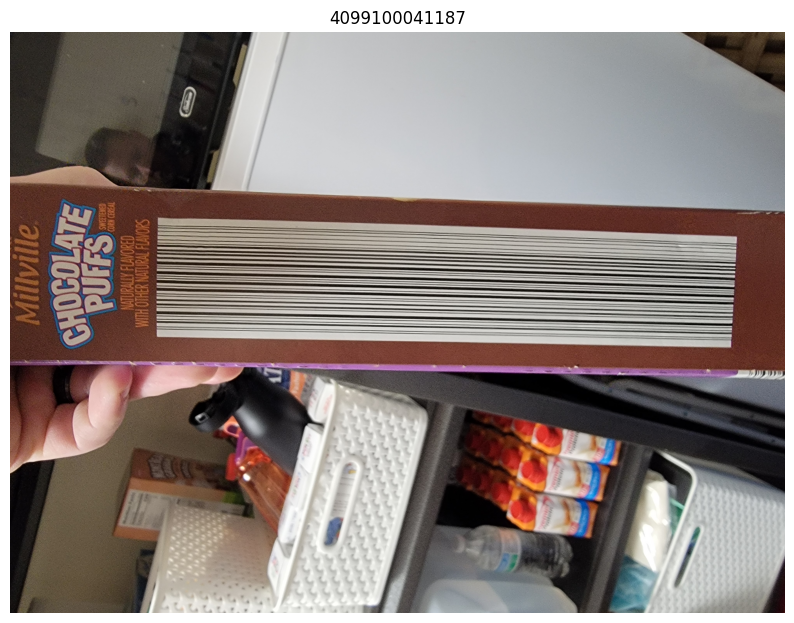

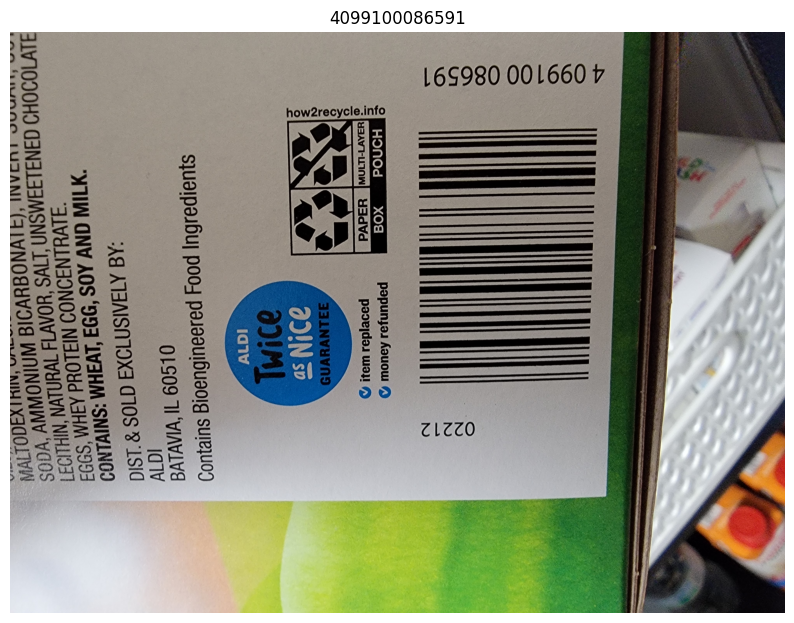

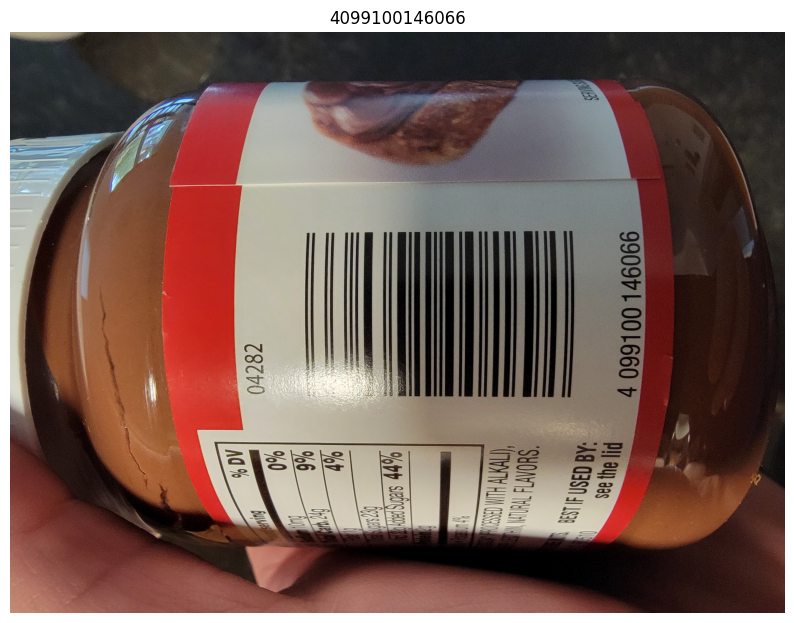

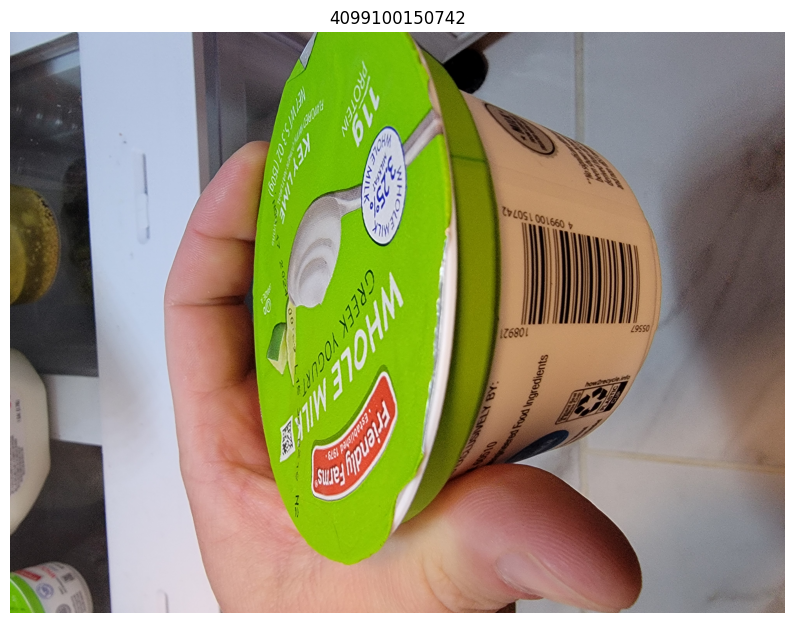

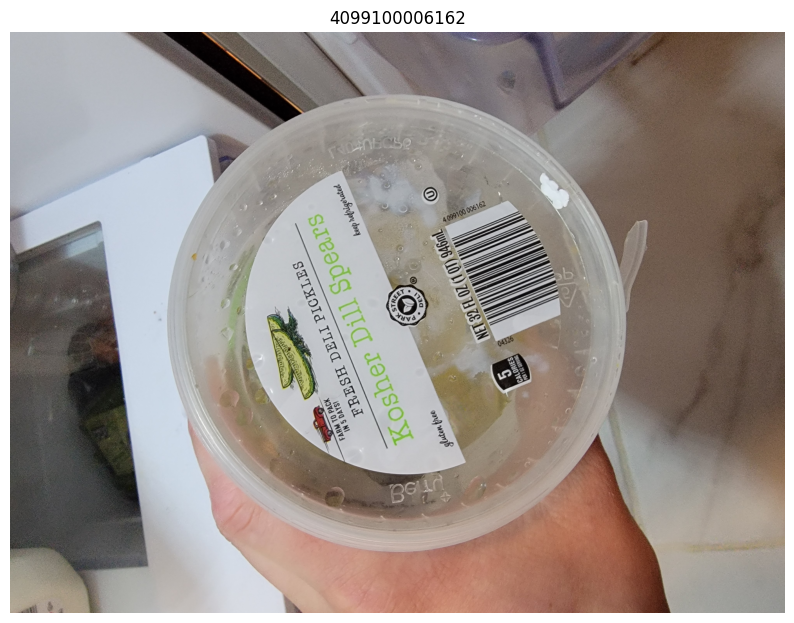

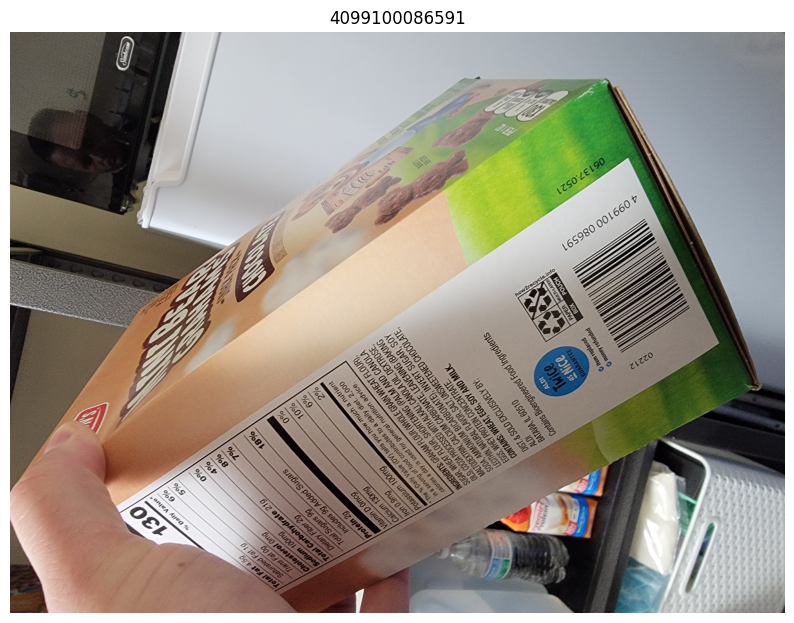

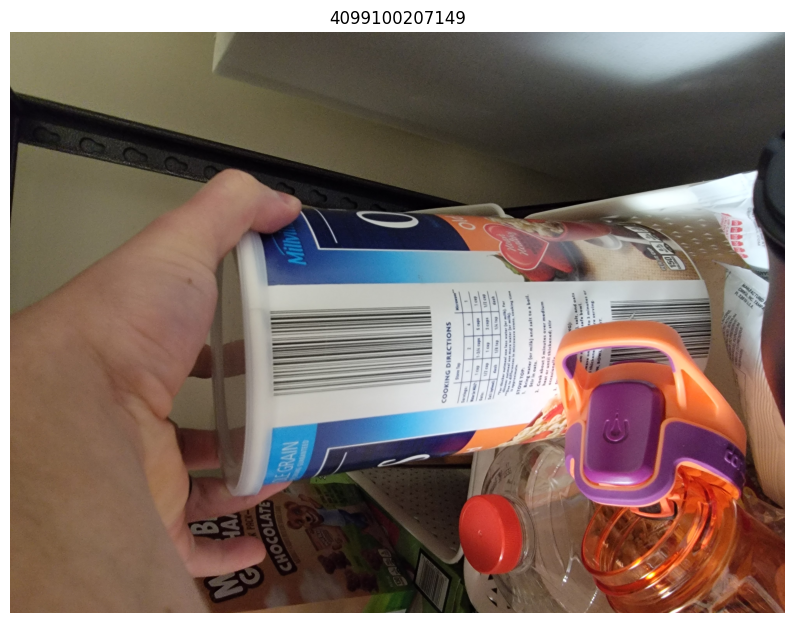

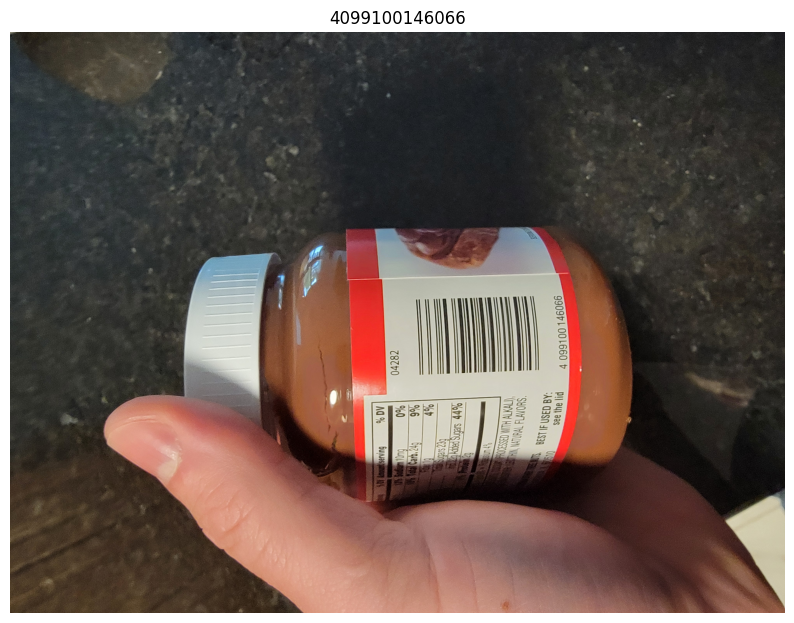

In [48]:
import os

# Get the directory of the first sample
directory = os.path.dirname(samples[0])

# Loop over all files in the directory
for filename in os.listdir(directory):
    file_path = os.path.join(directory, filename)
    if os.path.isfile(file_path):
        img = Image.open(file_path)
        codes = decode(img)
        for code in codes:
            plt.figure(figsize=(10, 10))
            plt.imshow(img)
            plt.title(code.data.decode('utf-8'))
            plt.axis('off')
            plt.show()

# Cropping
This seems to break the decoding rather than helping. Let's skip it for now.

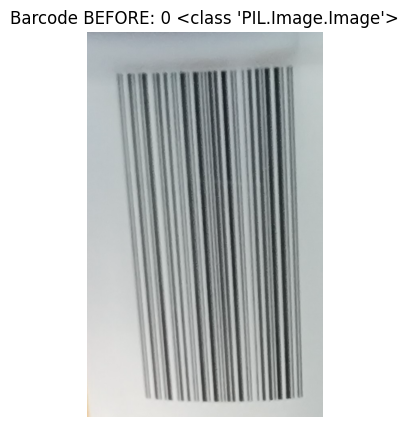

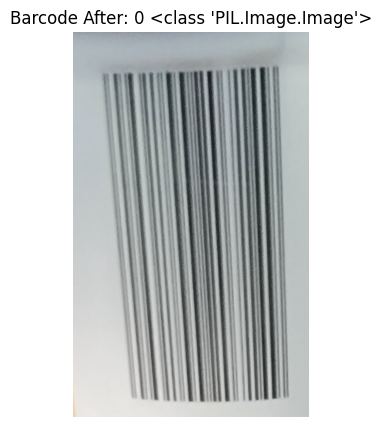

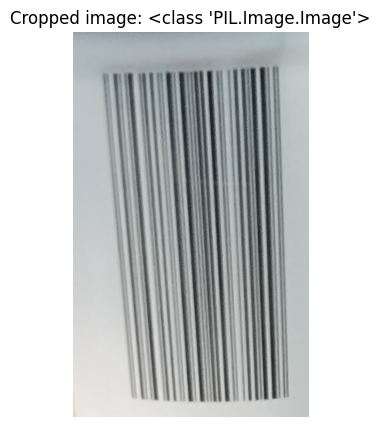

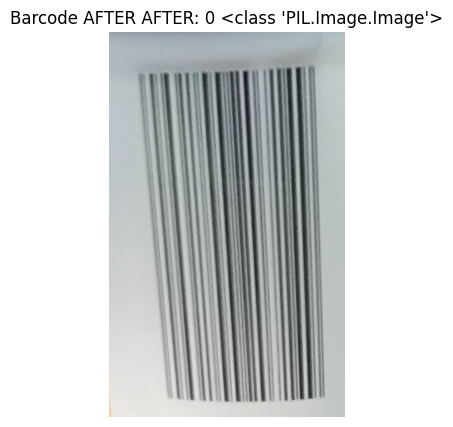

[]

In [36]:
from pyzbar.pyzbar import decode



# Show cropped images
if len(barcode_images):
    fig, axes = plt.subplots(1, 1, figsize=(15, 5))
    for i, ci in enumerate(barcode_images):
        plt.title(f"Barcode BEFORE: {i} {type(ci)}")
        plt.axis('off')
        axes.imshow(ci)
        plt.show()

def read_codes(cropped_image):
    fig, axes = plt.subplots(1, 1, figsize=(15, 5))
    plt.title(f"Cropped image: {type(cropped_image)}")
    plt.axis('off')
    axes.imshow(cropped_image)
    plt.show()
    
    decoded_barcodes = decode(cropped_image)
    barcodes = []

    for barcode in decoded_barcodes:
        barcode_data = barcode.data.decode('utf-8')  # EAN-13 data
        barcode_type = barcode.type  # Type of barcode (EAN13, CODE128, etc.)
        
        # Annotate the image with barcode data
        fig, ax = plt.subplots(1, 1, figsize=(12, 8))
        plt.title(f"Barcode: {barcode_type}: {barcode_data}")
        plt.axis('off')
        ax.imshow(cropped_image)
        barcodes.append((barcode_type, barcode_data))
    plt.show()
        
    return barcodes
        

all_barcodes = []
for i, ci in enumerate(barcode_images):
    fig, axes = plt.subplots(1, 1, figsize=(15, 5))
    plt.title(f"Barcode After: {i} {type(ci)}")
    plt.axis('off')
    axes.imshow(ci)
    plt.show()
    codes = read_codes(ci)
    # for (barcode_type, barcode_data) in codes:
    #     all_barcodes.append((barcode_type, barcode_data))

# Show cropped images
if len(barcode_images):
    fig, axes = plt.subplots(1, 1, figsize=(15, 5))
    for i, ci in enumerate(barcode_images):
        plt.title(f"Barcode AFTER AFTER: {i} {type(ci)}")
        plt.axis('off')
        axes.imshow(ci)
        plt.show()

# all_barcodes
codes


0: 640x480 1 Barcode, 7.7ms
Speed: 2.1ms preprocess, 7.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)
Execution time: 0.5761086940765381 seconds


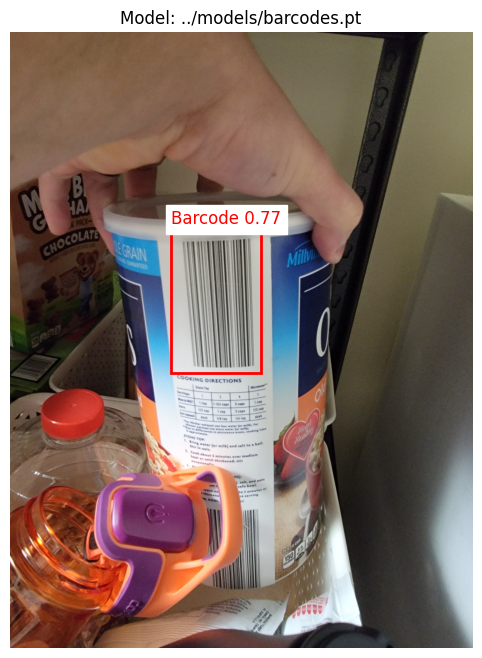


0: 480x640 1 Barcode, 7.5ms
Speed: 1.9ms preprocess, 7.5ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)
Execution time: 0.5601229667663574 seconds


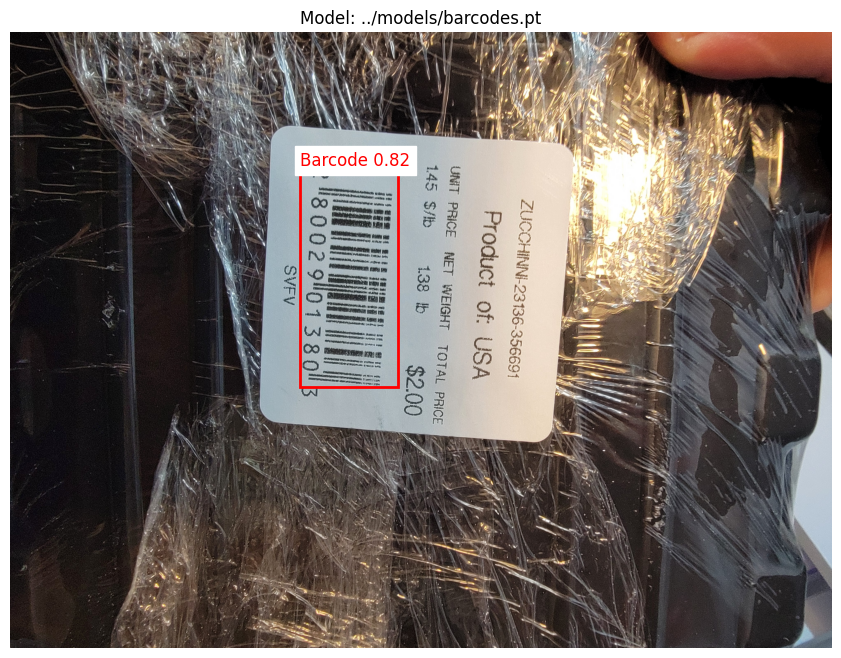


0: 640x480 1 Barcode, 7.4ms
Speed: 1.9ms preprocess, 7.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)
Execution time: 0.560513973236084 seconds


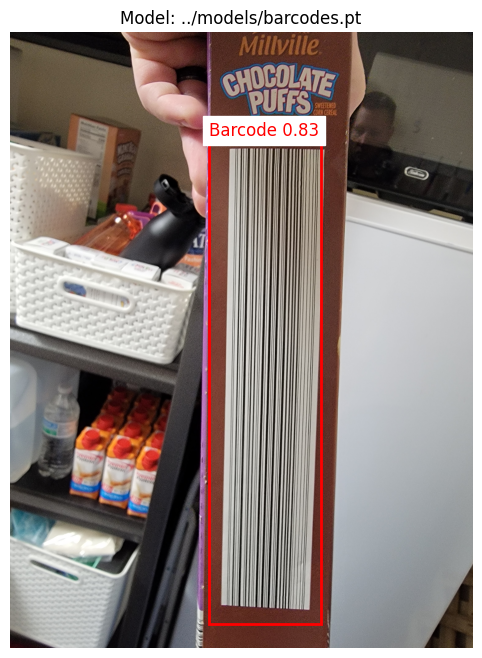

In [29]:
for sample in samples:
    evaluate_model(model, sample)


0: 640x480 3 Barcodes, 7.4ms
Speed: 1.9ms preprocess, 7.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


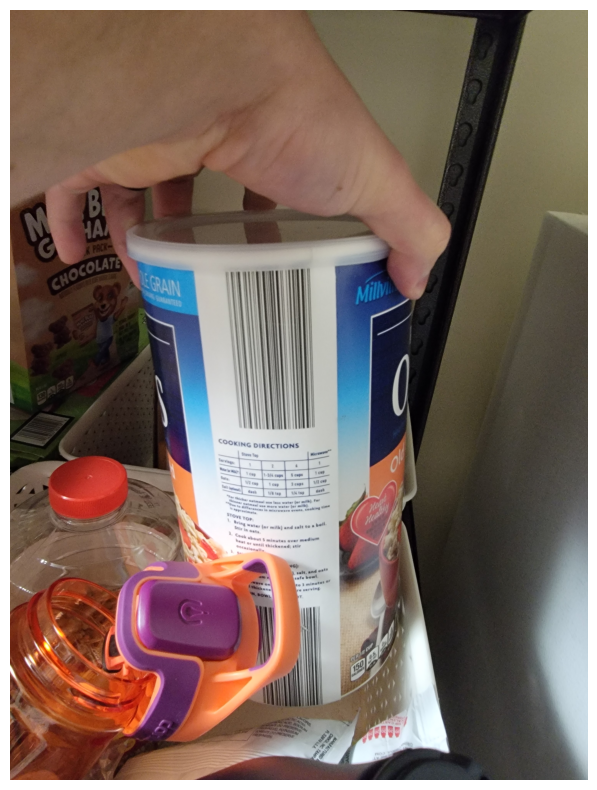


0: 480x640 1 Barcode, 8.3ms
Speed: 2.0ms preprocess, 8.3ms inference, 2.6ms postprocess per image at shape (1, 3, 480, 640)


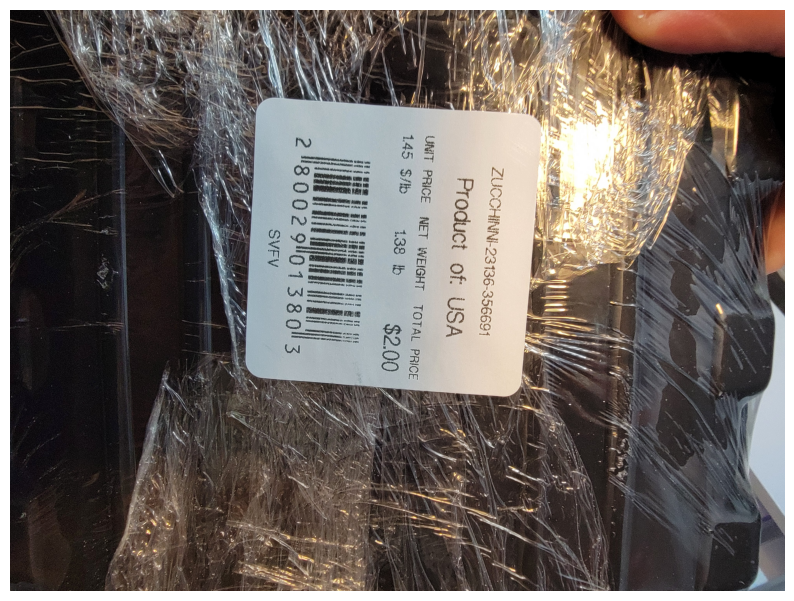


0: 640x480 1 Barcode, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


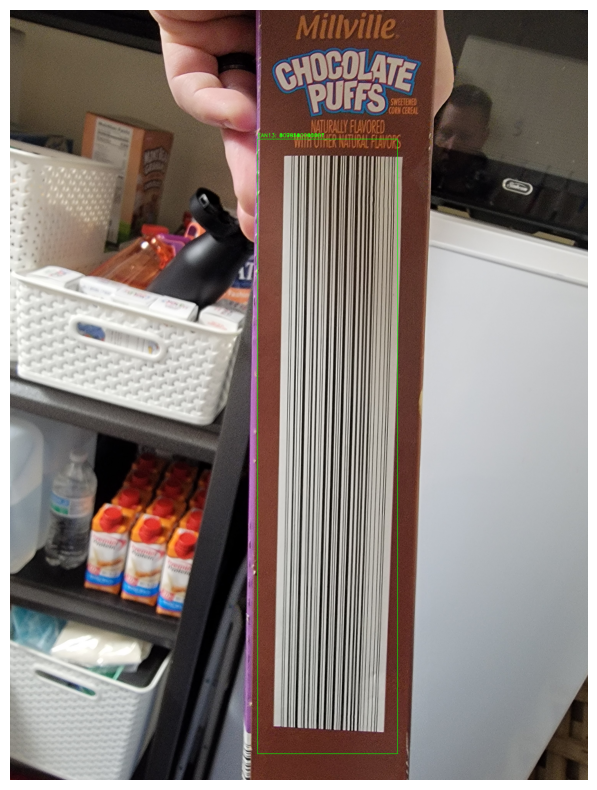

In [25]:
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO
from pyzbar.pyzbar import decode

# Load the YOLOv8 model
model = YOLO("../models/barcodes.pt")  # Replace 'best.pt' with your trained YOLOv8 model path

def extract_barcode(image_path):
    # Load the image
    image = cv2.imread(image_path)

    # Perform inference to detect barcodes
    results = model(image)

    # Convert BGR to RGB for display
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Loop through all detected barcodes and annotate the image
    for result in results:  # Iterate over all detected bounding boxes
        # Bounding box coordinates for each detected barcode
        xyxy = result.boxes.xyxy[0].cpu().numpy()
        x1, y1, x2, y2 = int(xyxy[0]), int(xyxy[1]), int(xyxy[2]), int(xyxy[3])
        
        # Crop the detected barcode area
        cropped_barcode = image[y1:y2, x1:x2]
        
        # Decode the barcode using pyzbar
        decoded_barcodes = decode(cropped_barcode)
        
        # Try decoding the barcode in multiple orientations (optional)
        if not decoded_barcodes:
            for angle in [90, 180, 270]:
                rotated_barcode = cv2.rotate(cropped_barcode, angle)
                decoded_barcodes = decode(rotated_barcode)
                if decoded_barcodes:
                    break
        
        # Loop through decoded barcodes
        for barcode in decoded_barcodes:
            barcode_data = barcode.data.decode('utf-8')  # EAN-13 data
            barcode_type = barcode.type  # Type of barcode (EAN13, CODE128, etc.)
            
            # Annotate the image with barcode data
            cv2.rectangle(image_rgb, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(image_rgb, f"{barcode_type}: {barcode_data}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36, 255, 12), 2)

    # Display the final image with all detected and decoded barcodes
    plt.figure(figsize=(10, 10))
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.show()

for sample in samples:
    barcode = extract_barcode(sample)

barcode


In [26]:
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO
from pyzbar.pyzbar import decode

# Load the YOLOv8 model
model = YOLO("../models/barcodes.pt")  # Replace 'best.pt' with your trained YOLOv8 model path

image_path = samples[0]

# Load the image
image = cv2.imread(image_path)

# Perform inference to detect barcodes
results = model(image)

# Convert BGR to RGB for display
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)





0: 640x480 3 Barcodes, 7.6ms
Speed: 2.0ms preprocess, 7.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


In [27]:
results

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Barcode', 1: 'QR Code'}
 obb: None
 orig_img: array([[[ 62,  88, 125],
         [ 63,  89, 126],
         [ 60,  86, 123],
         ...,
         [103, 137, 143],
         [103, 137, 143],
         [103, 137, 143]],
 
        [[ 62,  88, 125],
         [ 62,  88, 125],
         [ 61,  87, 124],
         ...,
         [104, 138, 144],
         [104, 138, 144],
         [105, 139, 145]],
 
        [[ 63,  91, 126],
         [ 63,  91, 126],
         [ 63,  91, 126],
         ...,
         [104, 138, 144],
         [103, 137, 143],
         [104, 138, 144]],
 
        ...,
 
        [[ 80, 100, 148],
         [ 75,  96, 147],
         [ 73,  94, 146],
         ...,
         [161, 156, 141],
         [163, 158, 143],
         [169, 164, 149]],
 
        [[ 73,  94, 145],
         [ 72,  93, 144],
         [ 70,  91, 143],
         ...,
   

In [ ]:
# Loop through all detected barcodes and annotate the image
for result in results:  # Iterate over all detected bounding boxes
    # Bounding box coordinates for each detected barcode
    xyxy = result.boxes.xyxy[0].cpu().numpy()
    x1, y1, x2, y2 = int(xyxy[0]), int(xyxy[1]), int(xyxy[2]), int(xyxy[3])
    
    # Crop the detected barcode area
    cropped_barcode = image[y1:y2, x1:x2]
    
    # Decode the barcode using pyzbar
    decoded_barcodes = decode(cropped_barcode)
    
    # Try decoding the barcode in multiple orientations (optional)
    if not decoded_barcodes:
        for angle in [90, 180, 270]:
            rotated_barcode = cv2.rotate(cropped_barcode, angle)
            decoded_barcodes = decode(rotated_barcode)
            if decoded_barcodes:
                break
    
    # Loop through decoded barcodes
    for barcode in decoded_barcodes:
        barcode_data = barcode.data.decode('utf-8')  # EAN-13 data
        barcode_type = barcode.type  # Type of barcode (EAN13, CODE128, etc.)
        
        # Annotate the image with barcode data
        cv2.rectangle(image_rgb, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(image_rgb, f"{barcode_type}: {barcode_data}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36, 255, 12), 2)

# Display the final image with all detected and decoded barcodes
plt.figure(figsize=(10, 10))
plt.imshow(image_rgb)
plt.axis('off')
plt.show()



0: 640x480 3 Barcodes, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 480)


AttributeError: 'Results' object has no attribute 'xyxy'. See valid attributes below.

    A class for storing and manipulating inference results.

    This class encapsulates the functionality for handling detection, segmentation, pose estimation,
    and classification results from YOLO models.

    Attributes:
        orig_img (numpy.ndarray): Original image as a numpy array.
        orig_shape (Tuple[int, int]): Original image shape in (height, width) format.
        boxes (Boxes | None): Object containing detection bounding boxes.
        masks (Masks | None): Object containing detection masks.
        probs (Probs | None): Object containing class probabilities for classification tasks.
        keypoints (Keypoints | None): Object containing detected keypoints for each object.
        obb (OBB | None): Object containing oriented bounding boxes.
        speed (Dict[str, float | None]): Dictionary of preprocess, inference, and postprocess speeds.
        names (Dict[int, str]): Dictionary mapping class IDs to class names.
        path (str): Path to the image file.
        _keys (Tuple[str, ...]): Tuple of attribute names for internal use.

    Methods:
        update: Updates object attributes with new detection results.
        cpu: Returns a copy of the Results object with all tensors on CPU memory.
        numpy: Returns a copy of the Results object with all tensors as numpy arrays.
        cuda: Returns a copy of the Results object with all tensors on GPU memory.
        to: Returns a copy of the Results object with tensors on a specified device and dtype.
        new: Returns a new Results object with the same image, path, and names.
        plot: Plots detection results on an input image, returning an annotated image.
        show: Shows annotated results on screen.
        save: Saves annotated results to file.
        verbose: Returns a log string for each task, detailing detections and classifications.
        save_txt: Saves detection results to a text file.
        save_crop: Saves cropped detection images.
        tojson: Converts detection results to JSON format.

    Examples:
        >>> results = model("path/to/image.jpg")
        >>> for result in results:
        ...     print(result.boxes)  # Print detection boxes
        ...     result.show()  # Display the annotated image
        ...     result.save(filename="result.jpg")  # Save annotated image
    